In [19]:
import pandas as pd
import numpy as np
import datetime
from datetime import timedelta

%matplotlib notebook

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import animation

from astropy.visualization import ImageNormalize, SqrtStretch, PowerStretch, LogStretch
import sunpy.map
from sunpy.map import Map
import sunpy_soar
from sunpy.net import Fido
import sunpy.net.attrs as a

import numpy as np

#Zooming packages
from matplotlib import patches
import astropy.units as u
from astropy.coordinates import SkyCoord
import sunpy.data.sample

import ffmpeg

# Big plots please..
plt.rcParams["figure.figsize"] = (8, 8)
mpl.rcParams['animation.ffmpeg_path'] = r'C:\Users\samuel.wechsler\OneDrive - PMOD WRC\Documents\Short project - solar physics\ffmpeg\bin\ffmpeg.exe'

In [20]:
fp_mac = '/Users/samuelwechsler/Library/CloudStorage/OneDrive-PMODWRC/Documents/Short project - solar physics/FSI304.csv'
fp_win = r'C:\Users\samuel.wechsler\OneDrive - PMOD WRC\Documents\Short project - solar physics\FSI304.csv'

data = pd.read_csv(fp_win)
df = pd.DataFrame(data)
del df['Unnamed: 0']
df

,Date,t1,t2,x_FOV,y_FOV,xs_CEN,ys_CEN,ys_FOV,xs_FOV,I_min,I_max,Is_min,Is_max,# maps,filename,Annotation
0,2021-11-09 16:38:00,2021-11-09 14:38:00,2021-11-09 18:38:00,2400.0,2400.0,1021.0,414.0,800.0,800.0,1.0,1583.0,1.0,1583.0,90.0,20211109_1638_FSI1304F.mp4,NaN
1,2021-12-04 05:02:00,2021-12-04 03:02:00,2021-12-04 07:02:00,2400.0,2400.0,839.0,-475.0,1000.0,1000.0,1.0,1417.0,1.0,1417.0,118.0,20211204_0502_FSI1304F.mp4,some weird rotation
2,2021-12-05 07:14:00,2021-12-05 05:14:00,2021-12-05 09:14:00,2200.0,2200.0,860.0,-449.0,600.0,600.0,1.0,1013.0,1.0,1013.0,96.0,20211205_0714_FSI1304F.mp4,NaN
3,2022-01-01 13:46:00,2022-01-01 11:46:00,2022-01-01 15:46:00,2300.0,2300.0,885.0,-202.0,1200.0,1200.0,1.0,1317.0,1.0,1317.0,16.0,20220101_1346_FSI1304F.mp4,NaN
4,2022-01-13 13:00:00,2022-01-13 11:00:00,2022-01-13 15:00:00,2300.0,2300.0,877.0,-449.0,800.0,800.0,1.0,1433.0,1.0,1433.0,16.0,20220113_1300_FSI1304F.mp4,NaN
5,2022-01-14 13:14:00,2022-01-14 11:14:00,2022-01-14 15:14:00,2300.0,2300.0,651.0,-564.0,1000.0,1000.0,1.0,2200.0,1.0,2200.0,16.0,20220114_1314_FSI1304F.mp4,NaN
6,2022-01-16 19:24:00,2022-01-16 17:24:00,2022-01-16 21:24:00,2400.0,2400.0,715.0,151.0,600.0,600.0,1.0,1667.0,1.0,1667.0,16.0,20220116_1924_FSI1304F.mp4,NaN
7,2022-01-18 17:32:00,2022-01-18 15:32:00,2022-01-18 19:32:00,2400.0,2400.0,967.0,146.0,800.0,800.0,1.0,1333.0,1.0,1333.0,12.0,20220118_1732_FSI1304F.mp4,NaN
8,2022-01-20 05:54:00,2022-01-20 03:54:00,2022-01-20 07:54:00,2400.0,2400.0,1035.0,141.0,700.0,700.0,1.0,1500.0,1.0,1500.0,12.0,20220120_0554_FSI1304F.mp4,NaN
9,2022-01-29 23:10:00,2022-01-29 21:10:00,2022-01-30 01:10:00,2500.0,2500.0,208.0,366.0,800.0,800.0,1.0,2367.0,1.0,2367.0,72.0,20220129_2310_FSI1304F.mp4,NaN


In [21]:
def FSI304Z():
    for i in range(len(df['Date'])):
        if True in list(np.isnan(df[['x_FOV', 'y_FOV', 'xs_FOV', 'ys_FOV']].loc[i])):
            continue
            
        t1 = df['t1'][i]
        t2 = df['t2'][i]
        
        instrument = a.Instrument('EUI')
        time = a.Time(t1, t2)
        level = a.Level(2)
        product = a.soar.Product('EUI-FSI304-IMAGE')
        result = Fido.search(instrument & time & level & product)
        
        if len(result)==0:
            continue
        
        files = Fido.fetch(result)
        l = len(files) - 1

        fig = plt.figure(dpi=300)
        sample_map = Map(files[0]).rotate(Map(files[0]).meta['crota'] * u.deg)
        ax = fig.add_subplot(projection=Map(files[0]))
        ax.axis('off')
        plot_obj = Map(files[0]).plot(axes=ax)
        
        length = 0.5 * df['xs_FOV'][i] * u.arcsec
        x0 = df['xs_CEN'][i] * u.arcsec
        y0 = df['ys_CEN'][i] * u.arcsec
        
        def animate(y):
            print(f'{y} of {len(files)}')
            m_eui = Map(files[l-y])
            bottom_left = SkyCoord(x0 - length, y0 - length, frame=m_eui.coordinate_frame)
            top_right = SkyCoord(x0 + length, y0 + length, frame=m_eui.coordinate_frame)
            submap = m_eui.submap(bottom_left, top_right=top_right)
            m_eui = m_eui.submap(bottom_left, top_right=top_right)
            m_eui = m_eui.rotate(m_eui.meta['crota'] * u.deg)
            m_eui.plot_settings['norm'] = ImageNormalize(vmin=1, vmax=df['I_max'][i], stretch=LogStretch(1000))
            ax.set_title(f"FSI 304 {m_eui.meta['date-obs']}")
            plot_obj.set_data(m_eui.data)
            return (plot_obj,)
        
        b = df['Date'][i]
        filename = b[:4]+b[5:7]+b[8:10]+'_'+b[11:13]+b[14:16]+'_FSI304Z.mp4'
        f = "C:\\Users\\samuel.wechsler\\OneDrive - PMOD WRC\\Documents\\Short project - solar physics\\FSI304Z_nc\\" + filename
        anim = animation.FuncAnimation(fig, animate, frames=len(files))
        plt.colorbar()
        Writer = animation.writers['ffmpeg']
        writer = Writer(fps=3)
        anim.save(f, writer=writer)


    

In [22]:
def FSI304F():
    for i in range(0, 38):
        if True in list(np.isnan(df[['x_FOV', 'y_FOV']].loc[i])):
            continue
        
        t2 = df['t1'][i]
        t1 = df['t2'][i]
        
        instrument = a.Instrument('EUI')
        time = a.Time(t1, t2)
        level = a.Level(2)
        product = a.soar.Product('EUI-FSI304-IMAGE')
        result = Fido.search(instrument & time & level & product)
        
        if len(result)==0:
            continue
        
        files = Fido.fetch(result)

        l = len(files) - 1
        
        fig = plt.figure(dpi=300)
        sample_map = Map(files[0]).rotate(Map(files[0]).meta['crota'] * u.deg)
        ax = fig.add_subplot(projection=Map(files[0]))
        ax.axis('off')
        plot_obj = Map(files[0]).plot(axes=ax)
        
        
        length = 0.5 * df['x_FOV'][i] * u.arcsec
        x0 = 0 * u.arcsec
        y0 = 0 * u.arcsec
        
        def animate(y):
            print(f'{y} of {len(files)}')
            m_eui = Map(files[l-y])
            bottom_left = SkyCoord(x0 - length, y0 - length, frame=m_eui.coordinate_frame)
            top_right = SkyCoord(x0 + length, y0 + length, frame=m_eui.coordinate_frame)
            m_eui = m_eui.submap(bottom_left, top_right=top_right)
            m_eui = m_eui.rotate(m_eui.meta['crota'] * u.deg)
            m_eui.plot_settings['norm'] = ImageNormalize(vmin=1, vmax=df['I_max'][i], stretch=LogStretch(1000))
            ax.set_title(f"FSI 304 {m_eui.meta['date-obs']}")
            plot_obj.set_data(m_eui.data)
            return (plot_obj,)
        

        b = df['Date'][i]
        filename = b[:4]+b[5:7]+b[8:10]+'_'+b[11:13]+b[14:16]+'_FSI304F.mp4'
        df.at[i, 'filename'] = filename
        f = "C:\\Users\\samuel.wechsler\\OneDrive - PMOD WRC\\Documents\\Short project - solar physics\\FSI304F_nc\\" + filename
        anim = animation.FuncAnimation(fig, animate, frames=len(files))
        plt.colorbar()
        Writer = animation.writers['ffmpeg']
        writer = Writer(fps=3)
        anim.save(f, writer=writer)


    

Files Downloaded:   0%|          | 0/144 [00:00<?, ?file/s]

<IPython.core.display.Javascript object>


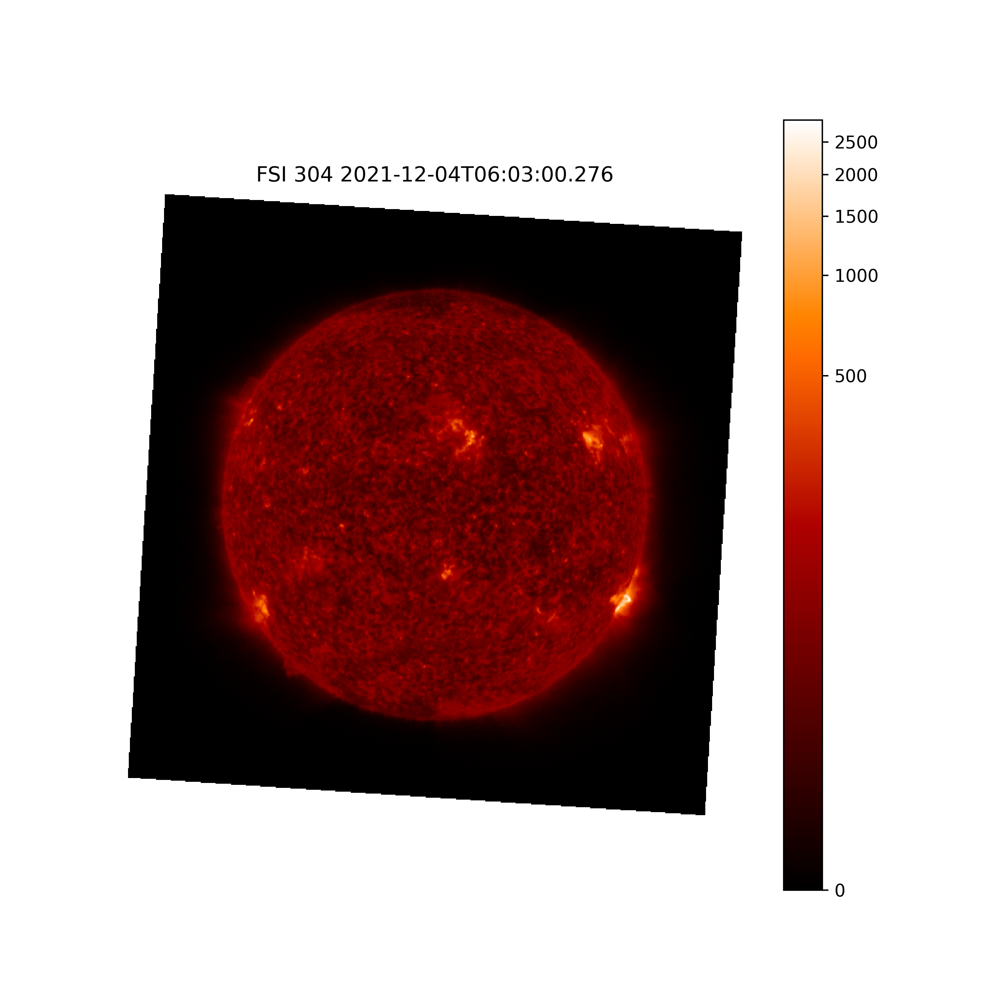

0 of 144
0 of 144
1 of 144
2 of 144
3 of 144
4 of 144
5 of 144
6 of 144
7 of 144
8 of 144
9 of 144
10 of 144
11 of 144
12 of 144
13 of 144
14 of 144
15 of 144
16 of 144
17 of 144
18 of 144
19 of 144
20 of 144
21 of 144
22 of 144
23 of 144
24 of 144
25 of 144
26 of 144
27 of 144
28 of 144
29 of 144
30 of 144
31 of 144
32 of 144
33 of 144
34 of 144
35 of 144
36 of 144
37 of 144
38 of 144
39 of 144
40 of 144
41 of 144
42 of 144
43 of 144
44 of 144
45 of 144
46 of 144
47 of 144
48 of 144
49 of 144
50 of 144
51 of 144
52 of 144
53 of 144
54 of 144
55 of 144
56 of 144
57 of 144
58 of 144
59 of 144
60 of 144
61 of 144
62 of 144
63 of 144
64 of 144
65 of 144
66 of 144
67 of 144
68 of 144
69 of 144
70 of 144
71 of 144
72 of 144
73 of 144
74 of 144
75 of 144
76 of 144
77 of 144
78 of 144
79 of 144
80 of 144
81 of 144
82 of 144
83 of 144
84 of 144
85 of 144
86 of 144
87 of 144
88 of 144
89 of 144
90 of 144
91 of 144
92 of 144
93 of 144
94 of 144
95 of 144
96 of 144
97 of 144
98 of 144
99 of 144
1

Files Downloaded:   0%|          | 0/103 [00:00<?, ?file/s]

<IPython.core.display.Javascript object>


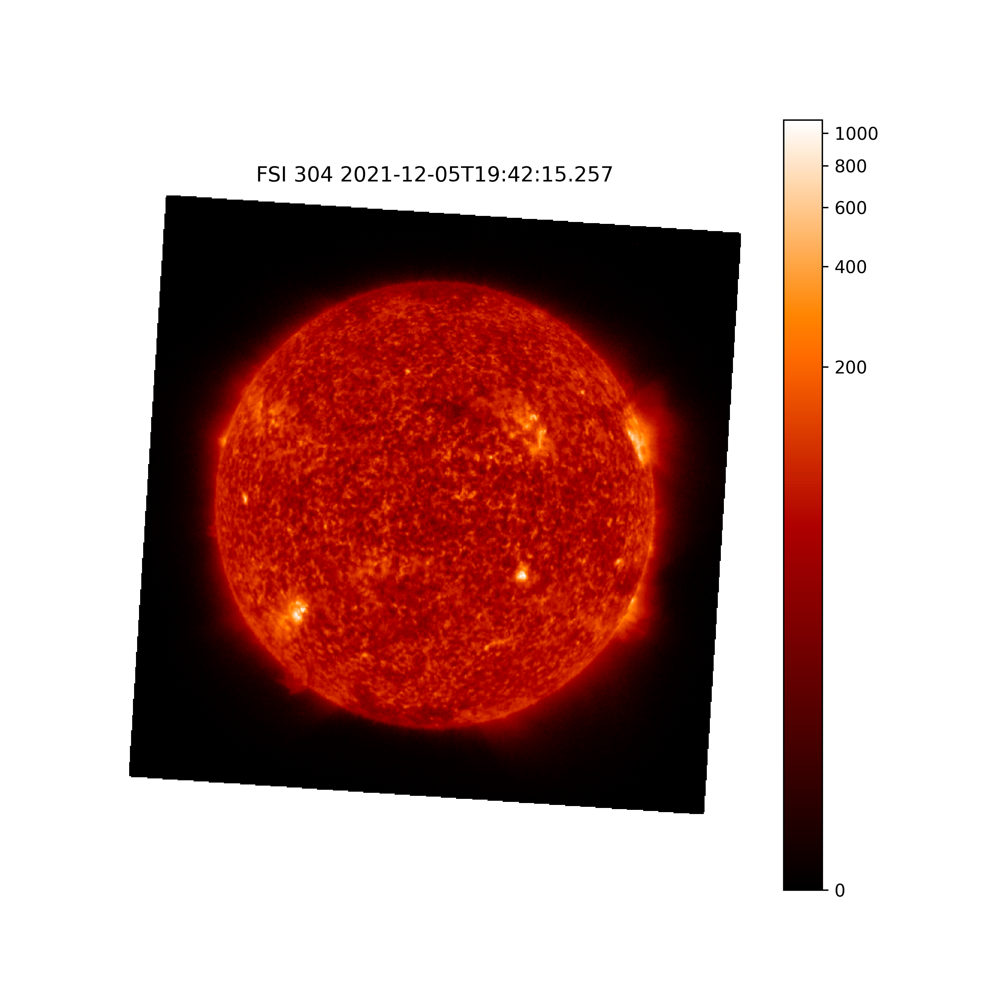

0 of 103
0 of 103
1 of 103
2 of 103
3 of 103
4 of 103
5 of 103
6 of 103
7 of 103
8 of 103
9 of 103
10 of 103
11 of 103
12 of 103
13 of 103
14 of 103
15 of 103
16 of 103
17 of 103
18 of 103
19 of 103
20 of 103
21 of 103
22 of 103
23 of 103
24 of 103
25 of 103
26 of 103
27 of 103
28 of 103
29 of 103
30 of 103
31 of 103
32 of 103
33 of 103
34 of 103
35 of 103
36 of 103
37 of 103
38 of 103
39 of 103
40 of 103
41 of 103
42 of 103
43 of 103
44 of 103
45 of 103
46 of 103
47 of 103
48 of 103
49 of 103
50 of 103
51 of 103
52 of 103
53 of 103
54 of 103
55 of 103
56 of 103
57 of 103
58 of 103
59 of 103
60 of 103
61 of 103
62 of 103
63 of 103
64 of 103
65 of 103
66 of 103
67 of 103
68 of 103
69 of 103
70 of 103
71 of 103
72 of 103
73 of 103
74 of 103
75 of 103
76 of 103
77 of 103
78 of 103
79 of 103
80 of 103
81 of 103
82 of 103
83 of 103
84 of 103
85 of 103
86 of 103
87 of 103
88 of 103
89 of 103
90 of 103
91 of 103
92 of 103
93 of 103
94 of 103
95 of 103
96 of 103
97 of 103
98 of 103
99 of 103
1

Files Downloaded:   0%|          | 0/90 [00:00<?, ?file/s]

<IPython.core.display.Javascript object>


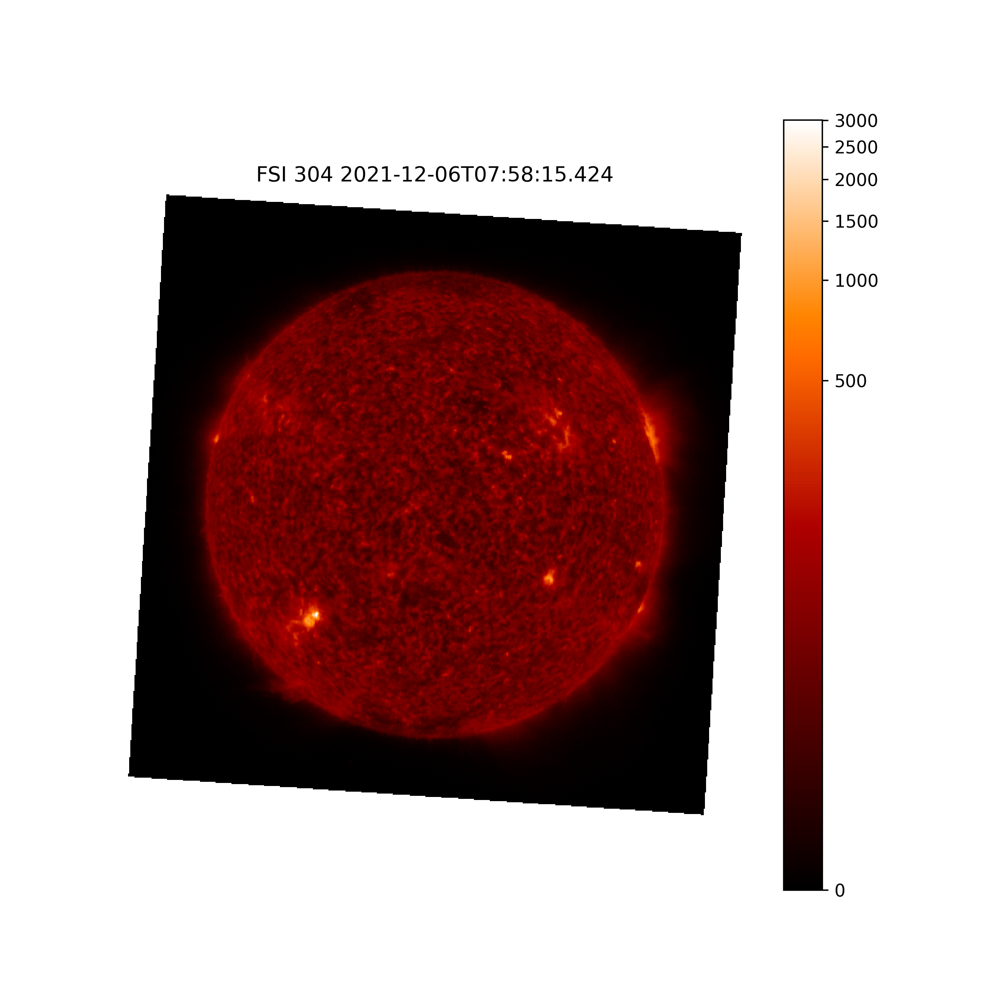

0 of 90
0 of 90
1 of 90
2 of 90
3 of 90
4 of 90
5 of 90
6 of 90
7 of 90
8 of 90
9 of 90
10 of 90
11 of 90
12 of 90
13 of 90
14 of 90
15 of 90
16 of 90
17 of 90
18 of 90
19 of 90
20 of 90
21 of 90
22 of 90
23 of 90
24 of 90
25 of 90
26 of 90
27 of 90
28 of 90
29 of 90
30 of 90
31 of 90
32 of 90
33 of 90
34 of 90
35 of 90
36 of 90
37 of 90
38 of 90
39 of 90
40 of 90
41 of 90
42 of 90
43 of 90
44 of 90
45 of 90
46 of 90
47 of 90
48 of 90
49 of 90
50 of 90
51 of 90
52 of 90
53 of 90
54 of 90
55 of 90
56 of 90
57 of 90
58 of 90
59 of 90
60 of 90
61 of 90
62 of 90
63 of 90
64 of 90
65 of 90
66 of 90
67 of 90
68 of 90
69 of 90
70 of 90
71 of 90
72 of 90
73 of 90
74 of 90
75 of 90
76 of 90
77 of 90
78 of 90
79 of 90
80 of 90
81 of 90
82 of 90
83 of 90
84 of 90
85 of 90
86 of 90
87 of 90
88 of 90
89 of 90


Files Downloaded:   0%|          | 0/16 [00:00<?, ?file/s]

<IPython.core.display.Javascript object>


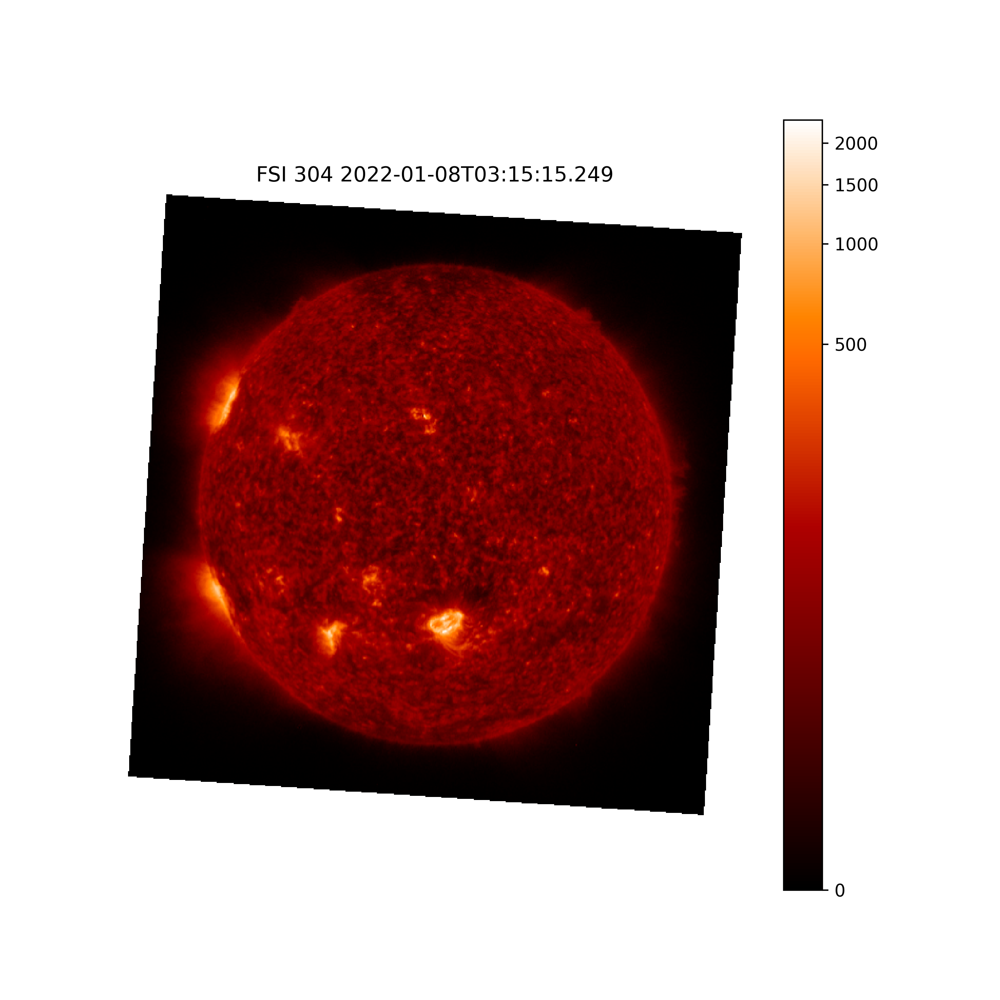

0 of 16
0 of 16
1 of 16
2 of 16
3 of 16
4 of 16
5 of 16
6 of 16
7 of 16
8 of 16
9 of 16
10 of 16
11 of 16
12 of 16
13 of 16
14 of 16
15 of 16


Files Downloaded:   0%|          | 0/16 [00:00<?, ?file/s]

<IPython.core.display.Javascript object>


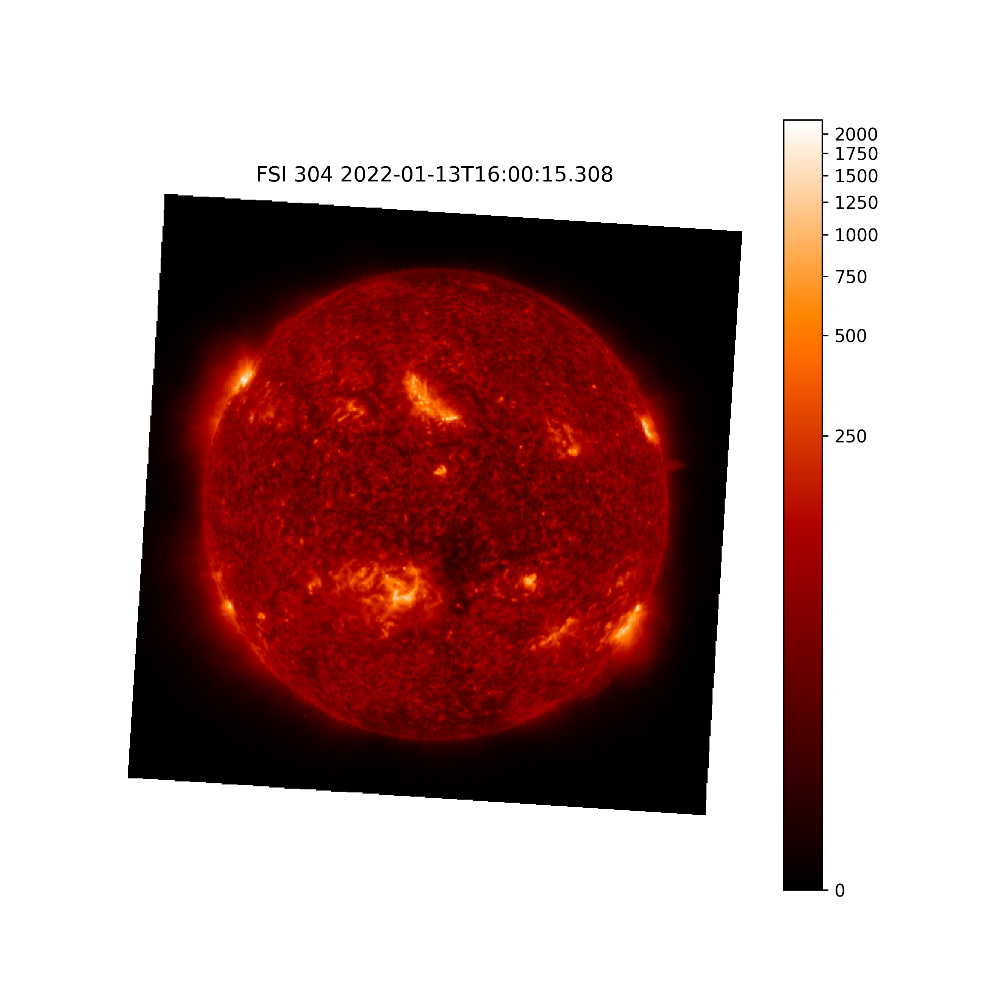

0 of 16
0 of 16
1 of 16
2 of 16
3 of 16
4 of 16
5 of 16
6 of 16
7 of 16
8 of 16
9 of 16
10 of 16
11 of 16
12 of 16
13 of 16
14 of 16
15 of 16


Files Downloaded:   0%|          | 0/72 [00:00<?, ?file/s]

<IPython.core.display.Javascript object>


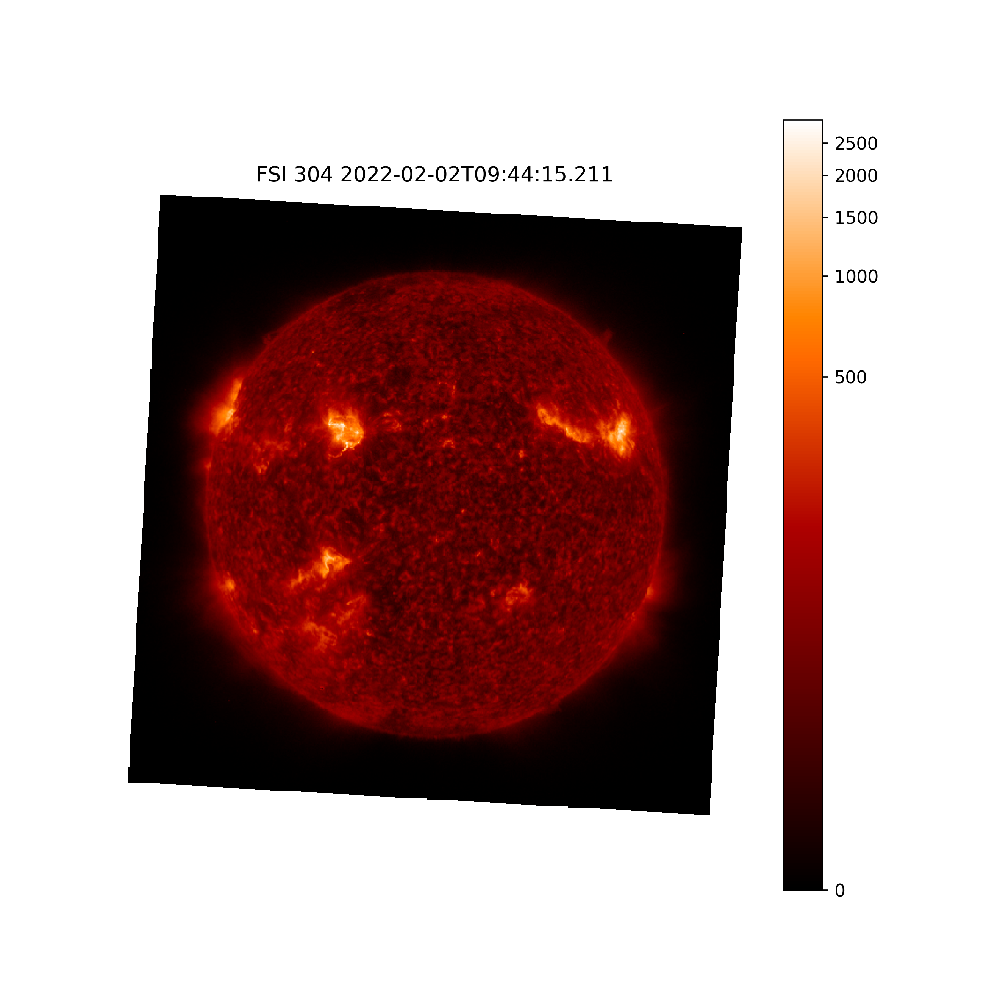

0 of 72
0 of 72
1 of 72
2 of 72
3 of 72
4 of 72
5 of 72
6 of 72
7 of 72
8 of 72
9 of 72
10 of 72
11 of 72
12 of 72
13 of 72
14 of 72
15 of 72
16 of 72
17 of 72
18 of 72
19 of 72
20 of 72
21 of 72
22 of 72
23 of 72
24 of 72
25 of 72
26 of 72
27 of 72
28 of 72
29 of 72
30 of 72
31 of 72
32 of 72
33 of 72
34 of 72
35 of 72
36 of 72
37 of 72
38 of 72
39 of 72
40 of 72
41 of 72
42 of 72
43 of 72
44 of 72
45 of 72
46 of 72
47 of 72
48 of 72
49 of 72
50 of 72
51 of 72
52 of 72
53 of 72
54 of 72
55 of 72
56 of 72
57 of 72
58 of 72
59 of 72
60 of 72
61 of 72
62 of 72
63 of 72
64 of 72
65 of 72
66 of 72
67 of 72
68 of 72
69 of 72
70 of 72
71 of 72


Files Downloaded:   0%|          | 0/54 [00:00<?, ?file/s]

<IPython.core.display.Javascript object>


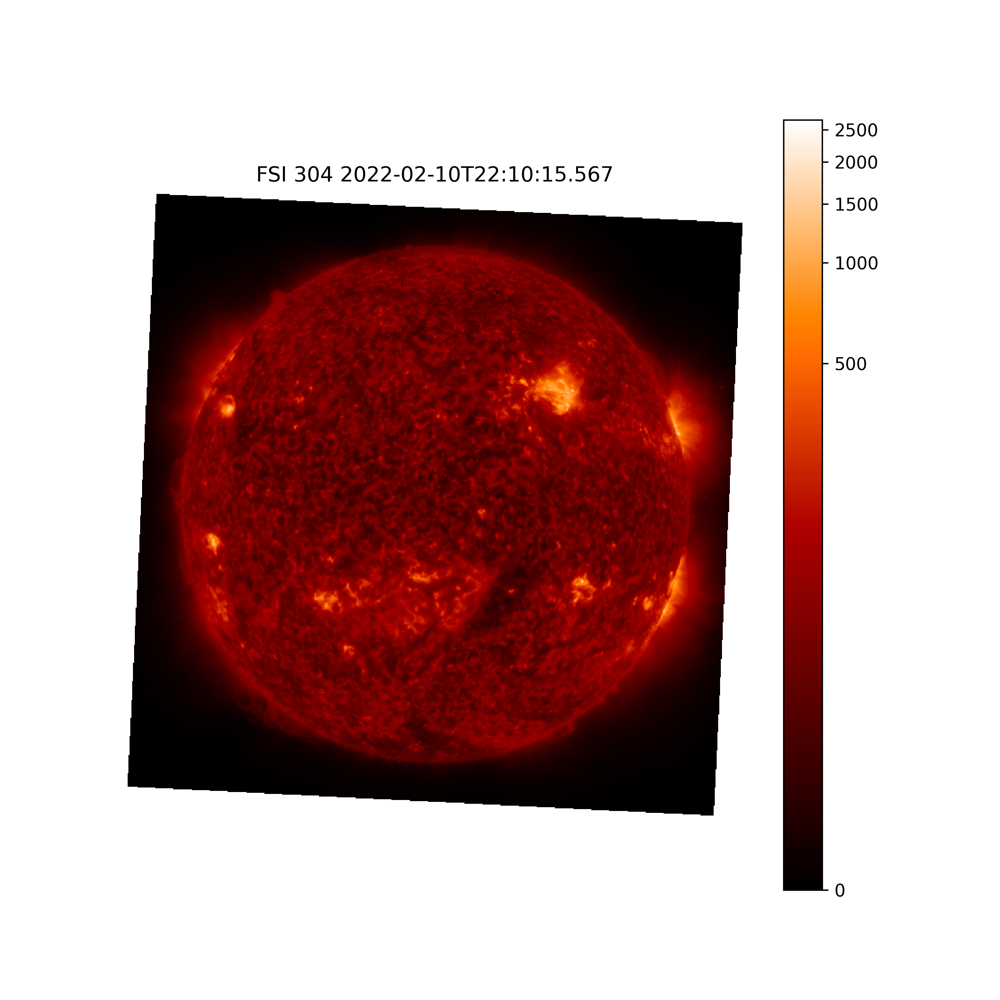

0 of 54
0 of 54
1 of 54
2 of 54
3 of 54
4 of 54
5 of 54
6 of 54
7 of 54
8 of 54
9 of 54
10 of 54
11 of 54
12 of 54
13 of 54
14 of 54
15 of 54
16 of 54
17 of 54
18 of 54
19 of 54
20 of 54
21 of 54
22 of 54
23 of 54
24 of 54
25 of 54
26 of 54
27 of 54
28 of 54
29 of 54
30 of 54
31 of 54
32 of 54
33 of 54
34 of 54
35 of 54
36 of 54
37 of 54
38 of 54
39 of 54
40 of 54
41 of 54
42 of 54
43 of 54
44 of 54
45 of 54
46 of 54
47 of 54
48 of 54
49 of 54
50 of 54
51 of 54
52 of 54
53 of 54


Files Downloaded:   0%|          | 0/8 [00:00<?, ?file/s]

<IPython.core.display.Javascript object>


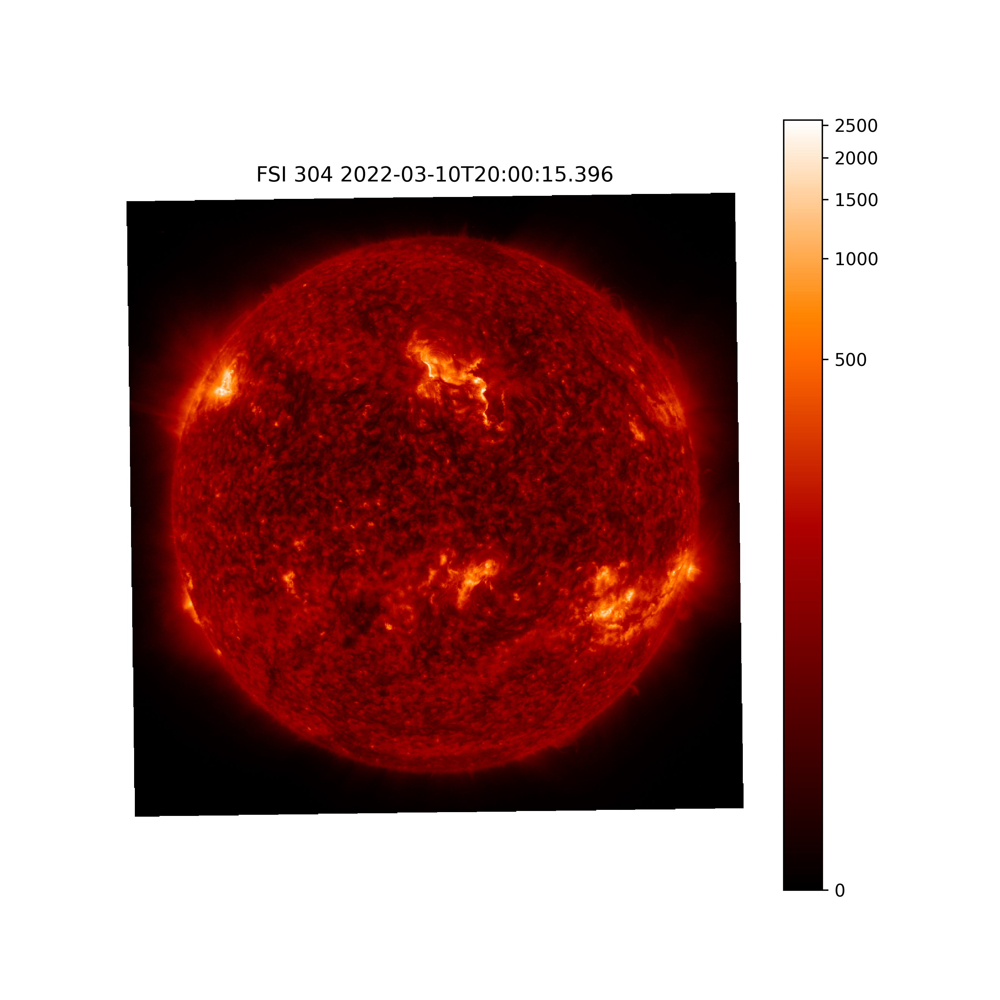

0 of 8
0 of 8
1 of 8
2 of 8
3 of 8
4 of 8
5 of 8
6 of 8
7 of 8


Files Downloaded:   0%|          | 0/8 [00:00<?, ?file/s]

<IPython.core.display.Javascript object>


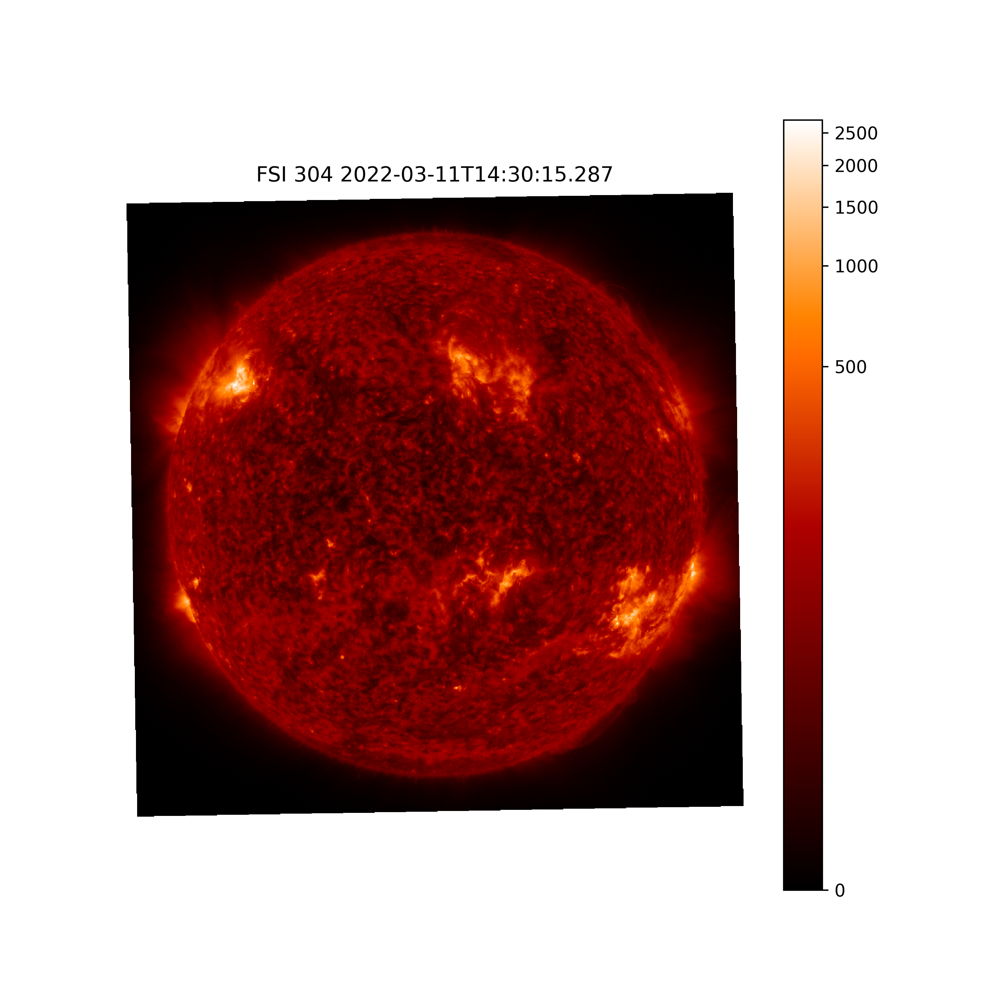

0 of 8
0 of 8
1 of 8
2 of 8
3 of 8
4 of 8
5 of 8
6 of 8
7 of 8


In [23]:
FSI304F()

In [ ]:
t2 = df['t1'][i]
t1 = df['t2'][i]
        
instrument = a.Instrument('EUI')
time = a.Time(t1, t2)
level = a.Level(2)
product = a.soar.Product('EUI-FSI304-IMAGE')
result = Fido.search(instrument & time & level & product)
files = Fido.fetch(result)

l = len(files) - 1
        
fig = plt.figure(dpi=300)
sample_map = Map(files[0]).rotate(Map(files[0]).meta['crota'] * u.deg)
ax = fig.add_subplot(projection=Map(files[0]))
ax.axis('off')
plot_obj = Map(files[0]).plot(axes=ax)
        
        
length = 0.5 * df['x_FOV'][i] * u.arcsec
x0 = 0 * u.arcsec
y0 = 0 * u.arcsec
        
def animate(y):
    print(f'{y} of {len(files)}')
    m_eui = Map(files[l-y])
    bottom_left = SkyCoord(x0 - length, y0 - length, frame=m_eui.coordinate_frame)
    top_right = SkyCoord(x0 + length, y0 + length, frame=m_eui.coordinate_frame)
    m_eui = m_eui.submap(bottom_left, top_right=top_right)
    m_eui = m_eui.rotate(m_eui.meta['crota'] * u.deg)
    m_eui.plot_settings['norm'] = ImageNormalize(vmin=1, vmax=df['I_max'][i], stretch=LogStretch(1000))
    ax.set_title(f"FSI 304 {m_eui.meta['date-obs']}")
    plot_obj.set_data(m_eui.data)
    return (plot_obj,)
        

b = df['Date'][i]
filename = df['filename'][i]
f = "C:\\Users\\samuel.wechsler\\OneDrive - PMOD WRC\\Documents\\Short project - solar physics\\FSI304F_nc\\" + filename
anim = animation.FuncAnimation(fig, animate, frames=len(files))
plt.colorbar()
Writer = animation.writers['ffmpeg']
writer = Writer(fps=3)
anim.save(f, writer=writer)